In [2]:
# Setting up a custom stylesheet in IJulia
file = open("style.css") # A .css file in the same folder as this notebook file
styl = readall(file) # Read the file
HTML("$styl") # Output as HTML

LoadError: [91mUndefVarError: readall not defined[39m

# The Gadfly plotting package

## In this lesson

+ [Introduction](#Introduction)
+ [Importing the packages for this lesson](#Importing-the-packages-for-this-lesson)
+ [Outcomes](#Outcomes)
+ [Simple plotting](#Simple-plotting)
+ [Adding layers](#Adding-layers)
+ [Using themes](#Using-themes)
+ [Adding titles and axis labels](#Adding-titles-and-axis-labels)
+ [Saving a plot](#Saving-a-plot)
+ [Plotting from data](#Plotting-from-data)
    + [Box and whisker plots](#Box-and-whisker-plots)
    + [Density plots](#Density-plots)
    + [Histograms](#Histograms)
    + [Violin plots](#Violin-plots)
    + [QQ plots](#QQ-plots)
    + [Scatter plots](#Scatter-plots)
    + [Vertical and horizontal lines](#Vertical-and-horizontal-lines)
+ [More examples](#More-examples)

<hr>
<h2>Introduction</h2>

Gadfly is a plotting system written in and for Julia.  Its really shines as a package for creating publication ready data plots.  To achieve this, plots can be exported as PDF, PNG, Postscript, and SVG files.  PNG, Postscript, and PDF files do require the `Cairo` package.

[Back to the top](#In-this-lesson)

## Importing the packages for this lesson

In [3]:
# Importing the Gadfly package for use in this notebook
using Gadfly;

In [4]:
# Use Cairo to add the ability to save PNG files
using Cairo;

In [5]:
# The Distribution package for random variables
using Distributions;

In [6]:
# The DataFrames package
using DataFrames;

[Back to the top](#In-this-lesson)

<hr>
<h2>Outcomes</h2>

After successfully completing this lecture, you will be able to:

- Create simple plots
- Use different geometries such as points and lines
- Layer plots on top of each other
- Use themes to change markers, line size, and color
- Save plots to you local system
- Create high-level plots such as box plots, histograms and scatter plots

[Back to the top](#In-this-lesson)

<hr>
<h2>Simple plotting</h2>

We'll start off by creating two computer variables that hold arrays of values.  We will use the `randn()` function to randomly select values from the standard normal distribution (mean of $ 1 $ and standard deviation of $ 0 $).

In [7]:
# Create 5 x-coordinate and 5 y-coordinate points, each value drawn at random from
# the values 1 through 5
# The semi-colon at the end supresses output to the screen (just don't anything after it)
xvals = rand(1:5, 5)

5-element Array{Int64,1}:
 1
 5
 2
 2
 3

In [8]:
yvals = rand(1:5, 5)

5-element Array{Int64,1}:
 1
 3
 5
 2
 5

Now we will invoke the `plot()` function and pass as arguments the arrays that we created above.  This will create a scatter plot.  It will plot a point, taking values that are made up of combinations of the elements in the `xvals` and `yvals` arrays.  The values of the elements in the arrays are referred to as **aesthetics**.

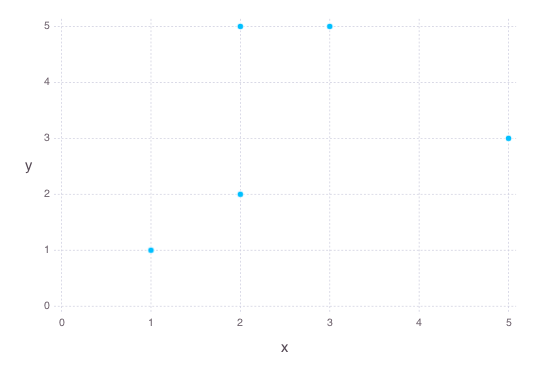

In [9]:
# Invoking the plot() function from Gadfly
# When we only pass two arguments (x and y) it results in a scatter plot (the geometry is taken
# as'Geom.point')
# The x and y arguments are referred to as aesthetics
plot(x = xvals, y = yvals)

The code above produced a scatter plot by default.  These point markers are referred to as the **geometry**.  We can actually specify the geometry with the `Geom.point` argument.

  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kerne

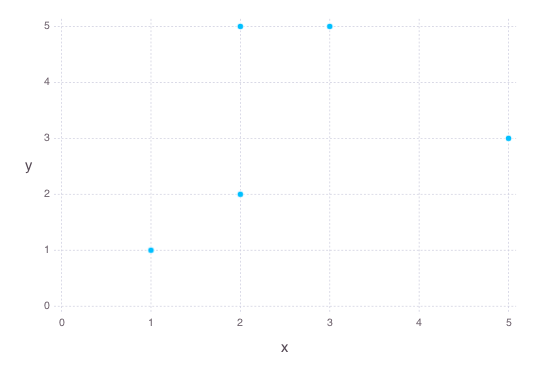

In [10]:
# Specifying the geomtery as points (which was done by default in the previous example)
# The point geometry takes the input x- and y-aesthetics
plot(x = xvals, y = yvals, Geom.point)

Just for fun we can create larger arrays (of similar size) and use the `sort()` function as part of the aesthetics.

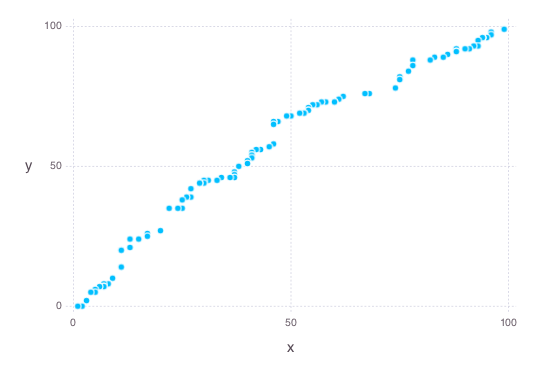

In [11]:
xvals2 = rand(0:100, 100) # 100 random values taken from the integers 0 through 100
yvals2 = rand(0:100, 100) # 100 random values taken from the integers 0 through 100

# Using the sort function (which changes the correlation)
plot(x = sort(xvals2), y = sort(yvals2))

We can add more than a single geometry.  Below we use the `Geom.line` argument to connect the point with lines.

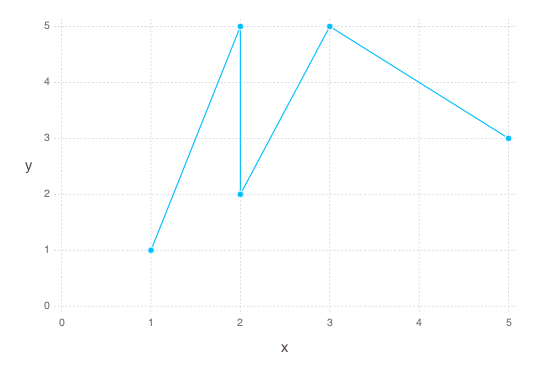

  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31
  likely near /Users/chaslemarchant/.julia/v0.6/IJulia/src/kernel.jl:31


In [12]:
# Adding another geomtery, which in this case is a line connecting the points
# The point and line geometries act on the xvals and yvals arrays
plot(x = xvals, y = yvals, Geom.point, Geom.line)

These lines need not be straight.  The `Geom.smooth` argument can itself take an argument.  There are actually only two arguments, `Geom.smooth(method = :loess)` and `Geom.smooth(method = :lm)`.  The last method creates linear model from the data points.

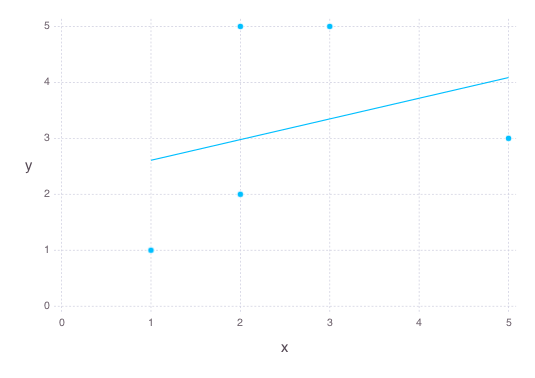

In [13]:
# We can also smooth out the line
plot(x = xvals, y = yvals, Geom.point, Geom.smooth(method = :lm)) #Geom.smooth(method = :loess) is default

[Back to the top](#In-this-lesson)

<hr>
<h2>Adding layers</h2>

A second set of data can be rendered on the same plot with the use of the `layer()` argument.  The geometry has to be specified for each layer.

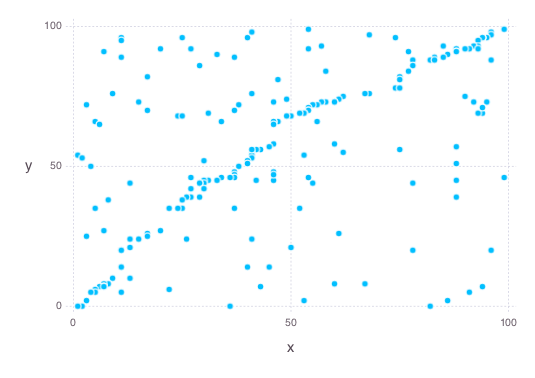

In [14]:
# Adding another layer using the layer() function
# The geometry has to be specified now
plot(layer(x = xvals2, y = yvals2, Geom.point), layer(x = sort(xvals2), y = sort(yvals2), Geom.point))

[Back to the top](#In-this-lesson)

## Using themes

From the plot above, it is not clear that we plotted more than one data set.  We could remedy this by adding some colors to our markers.  In order to do this we use the `Theme()` argument.  Below we see the `default_color` being set to `orange`.  The default color if no color is set is `deepskyblue`.

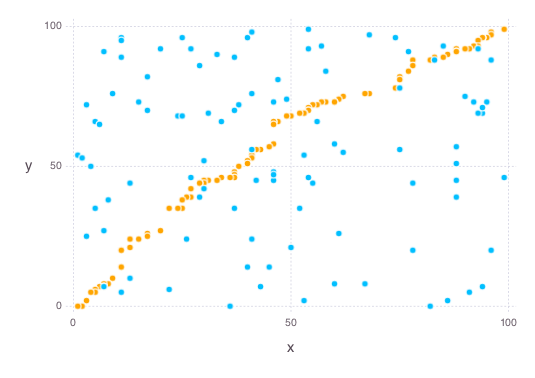

In [15]:
# It was not clear from the plot above that we were plotting two layers
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")))

It would be nice perhaps now to add a legend added to our plot.  Note below that we create two computer variables called `points1` and `points2` to hold the aesthetics. Then we use the `Guide()` argument.  It also holds a few arguments.  The first is the name of the legend (a string), the second is an array of strings, each element belonging to one of the data sets (in the order in which they are listed in the `plot()` function).  Lastly we have an array of colors.

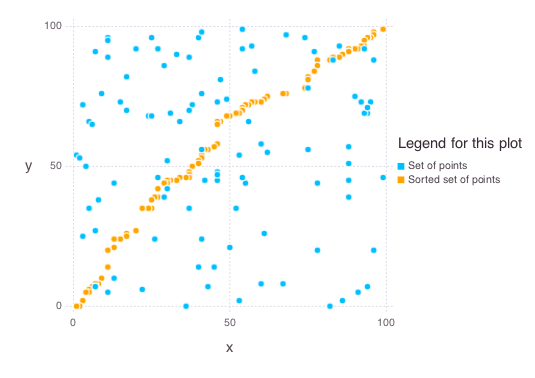

In [16]:
# Another way of doing layers
# Adding a legend
points1 = layer(x = xvals2, y = yvals2, Geom.point, Theme(default_color = colorant"deepskyblue"))
points2 = layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange"))
plot(points1, points2, Guide.manual_color_key("Legend for this plot",
["Set of points", "Sorted set of points"], ["deepskyblue", "orange"]))

The background grid can be hidden by using the `grid_color` argument in the `Themes` argument.  Below we set is to `white`.  This must be done as a separate `Theme` and not as part of one of the layers.  Notice that when you hover over the plot, that the grid appears again.

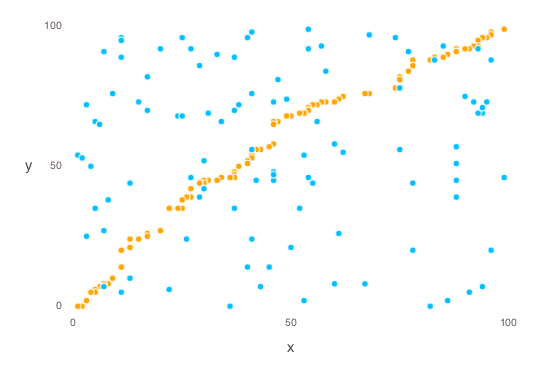

In [17]:
# Changing the grid color
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white"))

We can get rid of the mouse-over gridlines by setting them to `white` as well.  To do this we add the `grid_color_focused` argument.

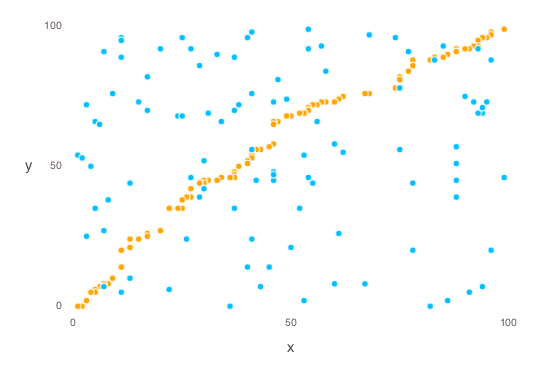

In [18]:
# Removing the pop-up (mouse-over) grid by changing its color to white too
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = colorant"orange")),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

Something else that we can do in the `Theme` argument is change some aspects of our aesthetics.  Below we simply increase the line width to $ 4 $ pixels.

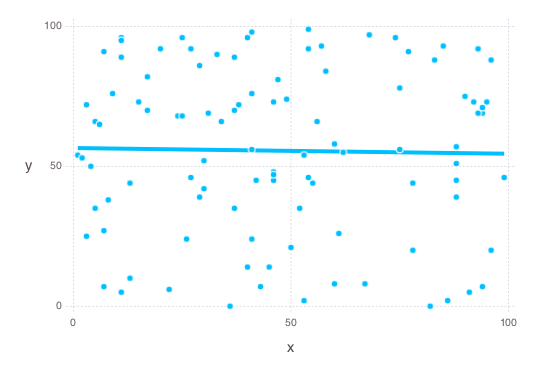

In [19]:
# Changing the size (stroke thickness) of the line
# Changing the line model
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm), Theme(line_width = 4px))

The `default_point_size` setting is used to change the `Geom.point` aesthetic.

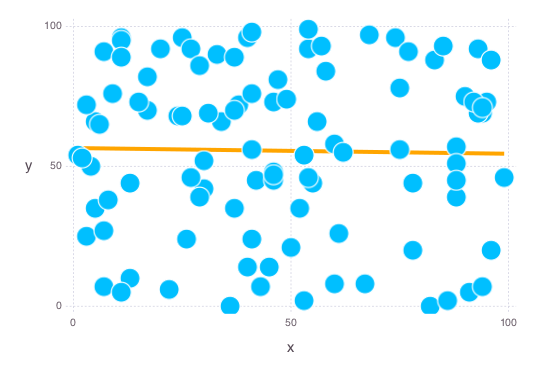

In [20]:
# Different colors for point and line by using different layers
# Changing the point size
plot(layer(x = xvals2, y = yvals2, Geom.point, Theme(point_size = 10px)),
layer(x = xvals2, y = yvals2, Geom.smooth(method = :lm), Theme(line_width = 4px,
default_color = colorant"orange")))

[Back to the top](#In-this-lesson)

## Adding titles and axis labels

When creating publication-ready plots, it is helpfull to add titles and axis labels to our plots.  To do this, we use the `Guide.title`, `Guide.xlabel`, and `Guide.ylabel` arguments.

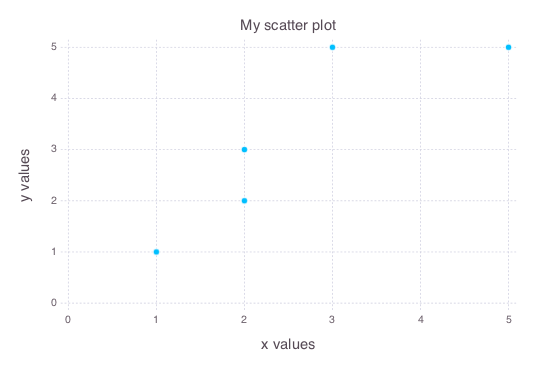

In [21]:
# Adding a plot title
# Adding a label for the x- and y-axes
plot(x = sort(xvals), y = sort(yvals), Geom.point, 
Guide.title("My scatter plot"),
Guide.xlabel("x values"), Guide.ylabel("y values"))

[Back to the top](#In-this-lesson)

## Saving a plot

We can save a plot to our local machine (or current working folder in JuliaBox) using the `draw` function.  The `Cairo` package that we imported at the start of this lecture allows us to save the plot as a PNG file.  The plot is passed as an argument and we also specify the file type, name, and size.

In [22]:
using Fontconfig

In [23]:
# Using normal distribution
# Calling the draw() function
# Saving the file as a PNG (using Cairo)
draw(PNG("myqqplot.png", 8inch, 6inch),
plot(x = rand(Normal(), 100), y = Normal(), Stat.qq, Geom.point, Guide.title("QQ plot")))

[Back to the top](#In-this-lesson)

## Plotting from data

`Gadfly` integrates well with the `DataFrames` package.  Whereas we used arrays as aesthetics above, we can use rows and columns in a DataFrame instead.  Below we import the `GadflyTutorialData.csv` file as a DataFrame and use the `tail()` function to look at the last $ 3 $ rows.

In [24]:
# Importing a .csv file and using the semicolon to supress the output
data = readtable("GadflyTutorialData.csv");

  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
in #readtable#84 at /Users/chaslemarchant/.julia/v0.6/DataFrames/src/dataframe/io.jl
  likely near In[24]:2
in #readtable#84 at /Users/chaslemarchant/.julia/v0.6/DataFrames/src/dataframe/io.jl
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
  likely near In[24]:2
in builddf at /Users/chaslemarchant/.julia/v0.6/DataFrames/src/dataframe/io.jl


In [25]:
# Looking at the last rows
# We note 200 row entries (patients)
# Gender, age, 4 variables and 3 categories
tail(data, 3)

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,198,M,49,11.2,95,1.8,53,B,X,R
2,199,M,36,24.2,97,8.2,58,A,R,P
3,200,F,48,10.3,114,20.4,63,B,C,P


Using the `showcols()` function we see a list of the variables, the data point value types and if any empty cells (missing data, `NA` values) are present.

In [26]:
# Data types in each column
# Note that there are no missing values
showcols(data)

200×10 DataFrames.DataFrame
│ Col # │ Name      │ Eltype  │ Missing │
├───────┼───────────┼─────────┼─────────┤
│ 1     │ Patient   │ Int64   │ 0       │
│ 2     │ Gender    │ String  │ 0       │
│ 3     │ Age       │ Int64   │ 0       │
│ 4     │ Variable1 │ Float64 │ 0       │
│ 5     │ Variable2 │ Int64   │ 0       │
│ 6     │ Variable3 │ Float64 │ 0       │
│ 7     │ Variable4 │ Int64   │ 0       │
│ 8     │ Category1 │ String  │ 0       │
│ 9     │ Category2 │ String  │ 0       │
│ 10    │ Category3 │ String  │ 0       │

The gender column holds nominal categorical data point values, being eithe `F` or `M`.  The`by()` function allows use to count the number of times each occurs.

In [27]:
# Count of number per group of gender
# Use the values for categorical data analysis
by(data, :Gender, d -> DataFrame(SampleSize = size(d, 1)))

,Gender,SampleSize
1,F,100
2,M,100


The `describe()` function gives us a descriptive statistical synopsis of any column that holds numerical data point values.

In [28]:
# Descriptive statistics of the Age column
describe(data[:Age])

Summary Stats:
Mean:           45.805000
Minimum:        35.000000
1st Quartile:   40.000000
Median:         46.000000
3rd Quartile:   52.000000
Maximum:        55.000000
Length:         200
Type:           Int64
Number Missing: 0
% Missing:      0.000000


In the case of categorical data point values we will only get a count, type and number and percentage of `NA` values using the `describe()` function.  We also see the number of unique data point values for the given variable.

In [29]:
describe(data[:Category1])

Summary Stats:
Length:         200
Type:           String
Number Unique:  2
Number Missing: 0
% Missing:      0.000000


[Back to the top](#In-this-lesson)

### Box and whisker plots

Up until now we have only seen scatter plots with points and lines.  `Gadfly` can produce a number of high-level plots that work very well for statistical data held in a DataFrame.  Let's start with the box-and-whisker plot.

Once again we use the `plot()` function.  The first argument now, though, is the DataFrame.  The `x` and `y` arguments now refer to columns in the DataFrame and references the column names as Symbols.  The geometry is specified as `Geom.box`.

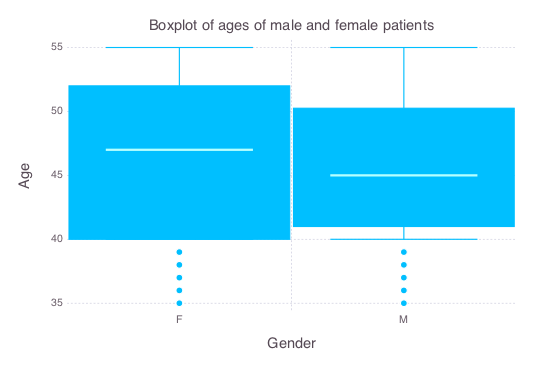

In [30]:
# Using a string and a symbol to refer to a column name for the x and y aesthetics
plot(data, x = "Gender", y = :Age, Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"))

The size and color of the boxes and the thickness of the median line can be changed using the `Theme` argument.  The $ x $-axis is populated by the unique values found in the `x` aesthetic.

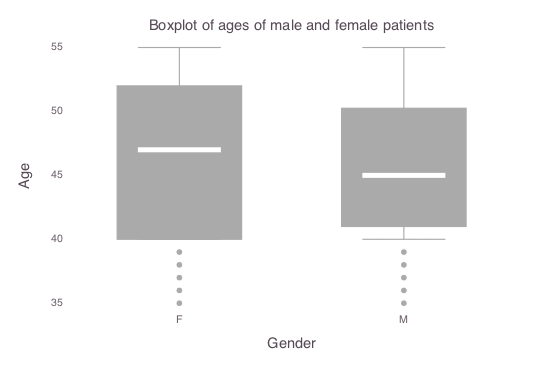

In [31]:
# Changing the size (stroke thickness) of the median line
# Change the color of the boxes and whiskers
# Increase the spacing between the boxes (making them thinner)
plot(data, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"),
Theme(boxplot_spacing = 100px, grid_color = colorant"white", default_color = colorant"#AAAAAA",
middle_width = 5px))

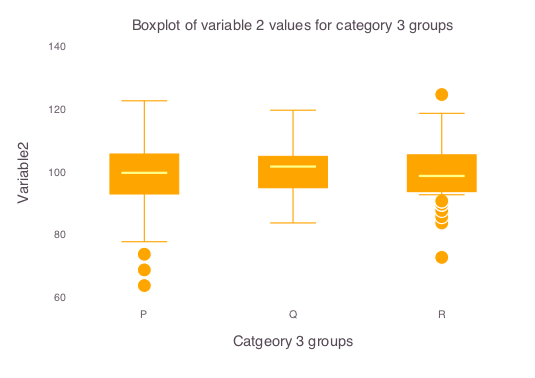

In [32]:
# Some more categories (by using Category 3)
# Bigger outlier points
plot(data, x = "Category3", y = "Variable2", Geom.boxplot,
Guide.title("Boxplot of variable 2 values for category 3 groups"),
Guide.xlabel("Catgeory 3 groups"), Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white",
boxplot_spacing = 80px, point_size = 7px))

We can also use the $ y $-axis as a categorical axis.  The `ygroup` argument can specify another variable by hwich to split the box plot.

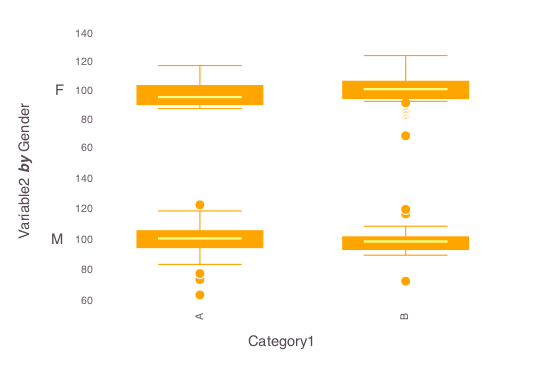

In [33]:
# Subplots to add another dimension to the plot
plot(data, ygroup = "Gender", x = "Category1", y = "Variable2", Geom.subplot_grid(Geom.boxplot),
Theme(default_color = colorant"orange",
grid_color = colorant"white", grid_color_focused = colorant"white",
boxplot_spacing = 80px, point_size = 5px))

[Back to the top](#In-this-lesson)

### Density plots

Density plots are all about continuous variables on the $ x $-axis.  We specify a numerical variable for the `x` aesthetic.

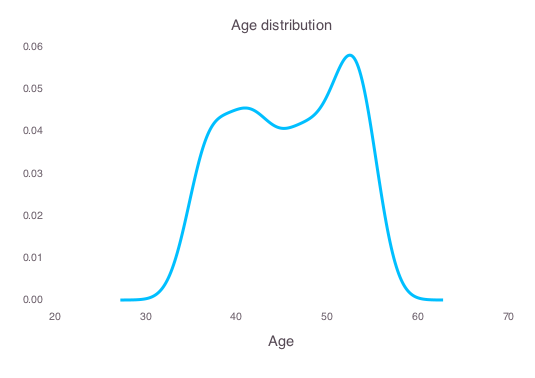

In [34]:
# Density estimate of ages
plot(data, x = "Age", Geom.density,
Guide.title("Age distribution"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white", line_width = 3px))

The `color` argument allows us to group by the unique data point values for a second variable.  Below we group the density plots by the `Gender` column and then by the `Category 3` column.

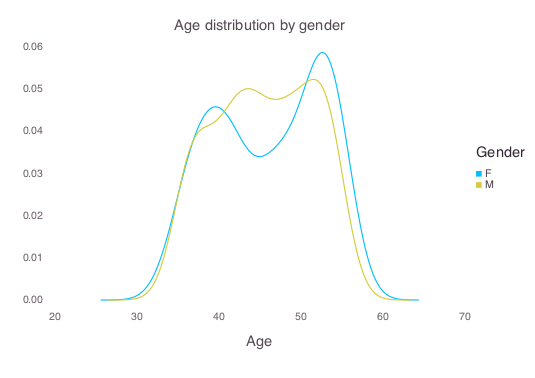

In [35]:
# Age distribution by group using the color argument
plot(data, x = "Age", color = "Gender", Geom.density,
Guide.title("Age distribution by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

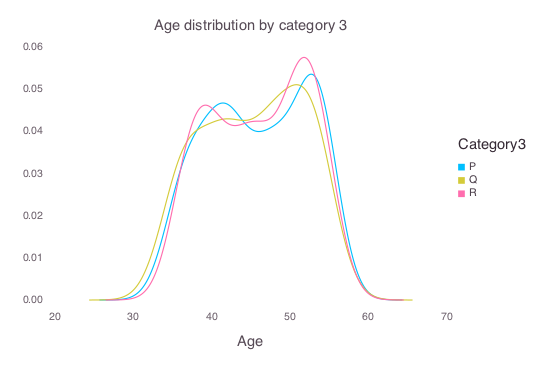

In [36]:
plot(data, x = "Age", color = "Category3", Geom.density,
Guide.title("Age distribution by category 3"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

[Back to the top](#In-this-lesson)

### Histograms

As with density estimates, it's all about continuous variables on the $ x $-axis.  We use the `Geom.histogram` geometry.

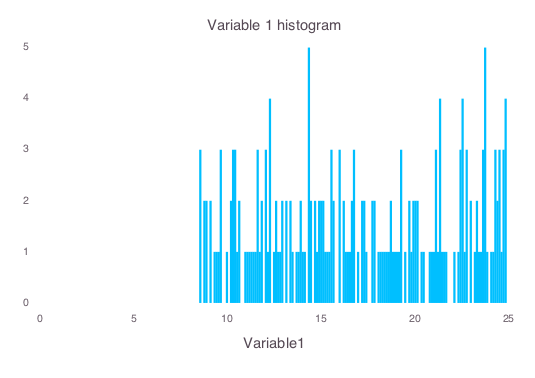

In [37]:
plot(data, x = "Variable1", Geom.histogram,
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

The size of the bins can be controlled with the `bincount` argument.

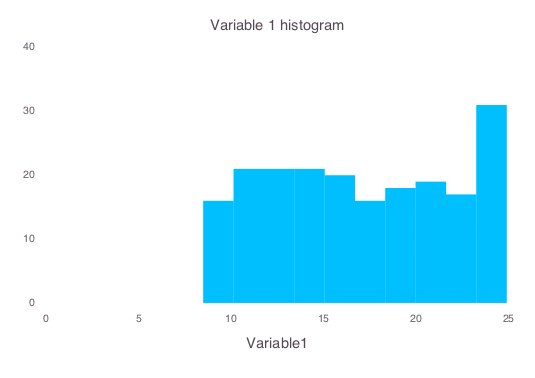

In [38]:
# Controlling the bincount
plot(data, x = "Variable1", Geom.histogram(bincount = 10),
Guide.title("Variable 1 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

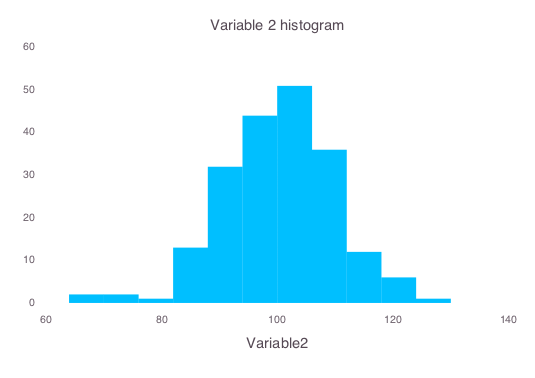

In [39]:
# A variable with a more normal distribution
plot(data, x = "Variable2", Geom.histogram(bincount = 11),
Guide.title("Variable 2 histogram"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

Just as with the density plots we can use the `color` argument to plot the distribution of more than one group.  Below we draw a histogram of the age distribution according to gender.

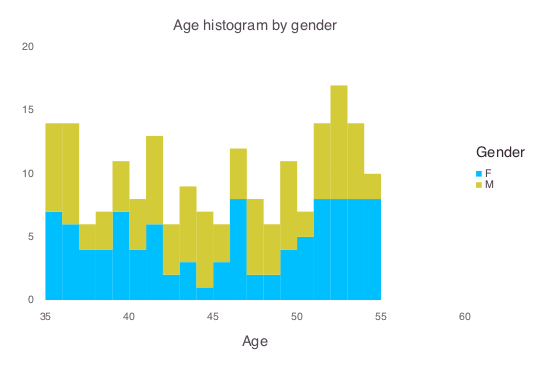

In [40]:
# An x-axis variable for more than one categorical groups
plot(data, x = "Age", color = "Gender", Geom.histogram(bincount = 21),
Guide.title("Age histogram by gender"),
Theme(grid_color = colorant"white", grid_color_focused = colorant"white"))

[Back to the top](#In-this-lesson)

## Violin plots

Violin plots combine density estimates with box and whisker plots.  We use the`Geom.violin` geometry.

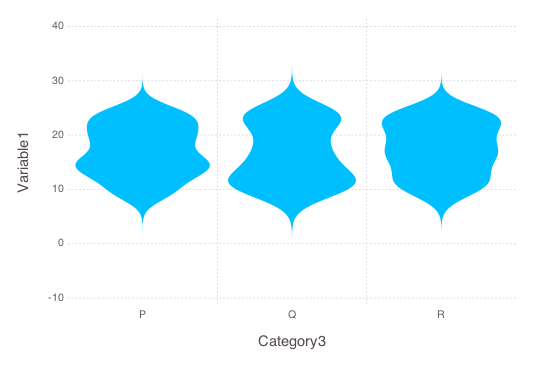

In [41]:
plot(data, x = :Category3, y = :Variable1, Geom.violin)

[Back to the top](#In-this-lesson)

### QQ plots

QQ plots help us decide of data point values for a variable are drawn from a certain distribution.  We imported the `Distributions` package, so below we plot random values taken from the $ {\chi}^{2} $ distribution again the normal distribution.  We note that it is not a straight line.  This will help us to decide to use non-parametric statistical tests when analyzing this data.  Note the use of the `Stat.qq` statistic.

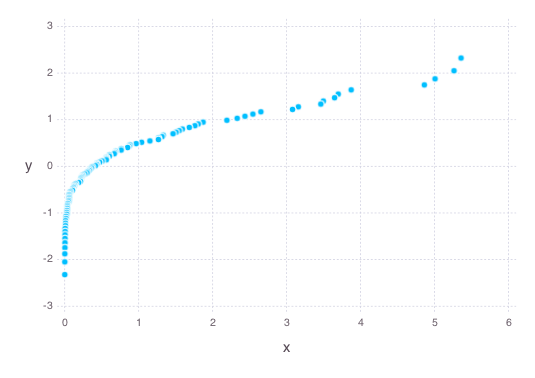

In [42]:
# These sample point were not from a population in which the underlying variable is
# normally distributed (cannot use non-parametric tests)
plot(x = rand(Chisq(1), 100), y = Normal(), Stat.qq, Geom.point)

Below we use some of our DataFrame values (`Variable 1`) and plot it as a QQ plot against a normal distribution with the mean and standrad deviation of the values in `Variable 1`.

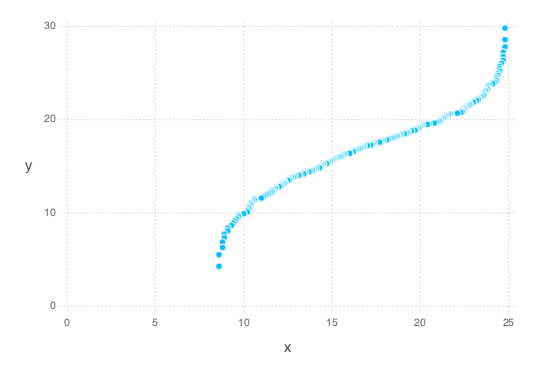

In [43]:
# Checking to see if variable 1 is from a sample in which the underlying population has that
# variable normally distributed
plot(x = sort(data[:Variable1]), y = Normal(mean(data[:Variable1]), std(data[:Variable1])), Stat.qq, Geom.point)

We note that the values in `Variable 1` was not from a population in which that parameter is normally distributed and hence we should use non-parametric statistical tests.  Let's have a look at `Variable 2`.

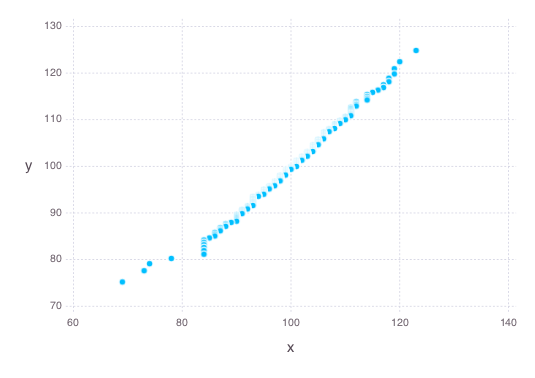

In [44]:
# Variable 2
plot(x = sort(data[:Variable2]), y = Normal(mean(data[:Variable2]), std(data[:Variable2])), Stat.qq, Geom.point)

[Back to the top](#In-this-lesson)

### Scatter plots

We have looked at scatter plots, but let's do a few more examples.  First we will plot the pairs of values for `Variable 1` and `Variable 2` as grouped by the unique data point values in `Category 3`.

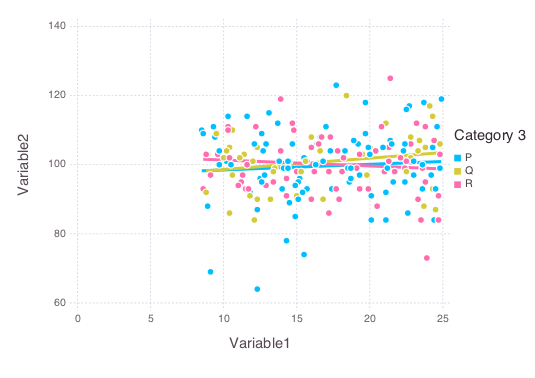

In [45]:
# Setting the title for the graph key (legend)
plot(data, x = "Variable1", y ="Variable2", color = "Category3",
Geom.point, Geom.smooth(method = :lm), Guide.colorkey("Category 3"), Theme(line_width = 3px))

Here is an example of grouping on the $ y $-axis.

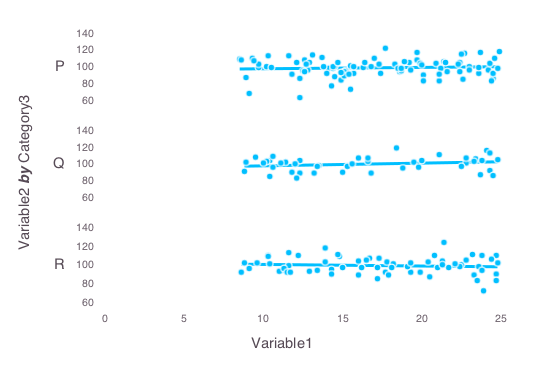

In [46]:
# Subplots to add another dimension to the plot
plot(data, ygroup = "Category3", x = "Variable1", y = "Variable2",
Geom.subplot_grid(Geom.point, Geom.smooth(method = :lm)),
Theme(grid_color = colorant"white", line_width = 3px))

[Back to the top](#In-this-lesson)

## Vertical and horizontal lines

We can draw both vertical and horizontal lines on our plots with the `yintercept` and `xintercept` arguments combined with the `Geom.hline` and `Geom.vline` geometries.

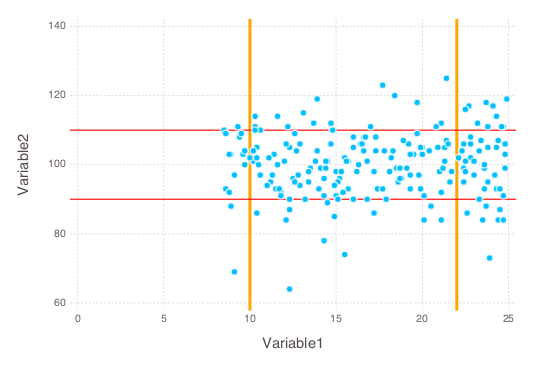

In [47]:
# Drawing two vertical and two horizontal lines
# Adding size and color
plot(data, x = "Variable1", y = "Variable2", yintercept = [90, 110], Geom.point, Geom.hline(color = colorant"Red"),
xintercept = [10, 22], Geom.vline(size = 3px, color = colorant"Orange"))

[Back to the top](#In-this-lesson)

## More examples

### Step lines

The `Geom.step` geometry together with the horizontal then vertical argument `direction = :hv` or vertical then horizontal argument `:vh` plots step lines.

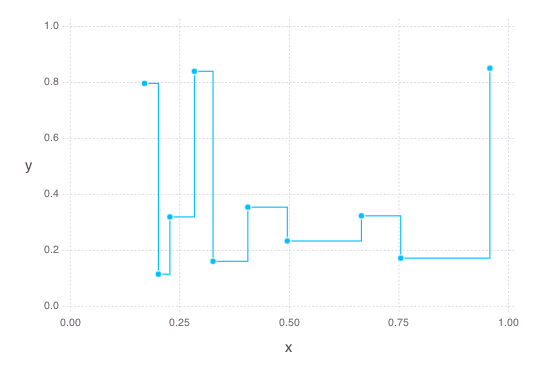

In [48]:
# Horizontal then vertical
x = rand(10)
y = rand(10)
plot(x = x, y = y, Geom.point, Geom.step(direction = :hv))

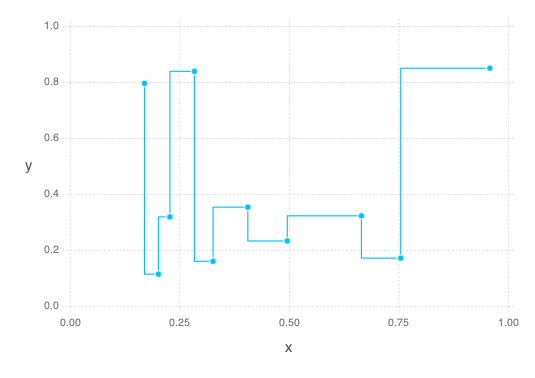

In [49]:
# Vertical then horizontal
plot(x = x, y = y, Geom.point, Geom.step(direction = :vh))

### Beeswarm

A beeswarm plot uses categorical variables on the $ x $-axis and plots values for a numerical value on the $ y $-axis.  It can also be grouped with the `color` argument.  Some horizontal jitter is built in.

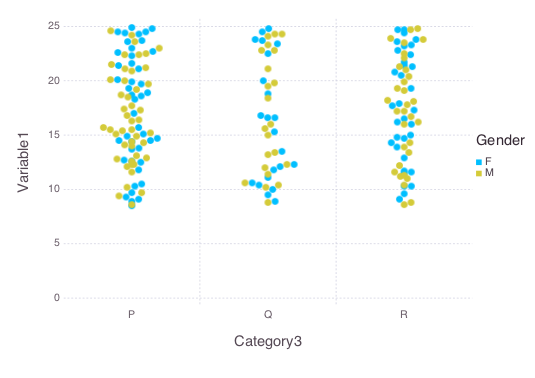

In [50]:
plot(data, x = :Category3, y = :Variable1, color = :Gender, Geom.beeswarm)

### Continuous color scales

Grouping values for a plot using the `color` argument does not have to be categorical.  It can also be done on a continuous scale.

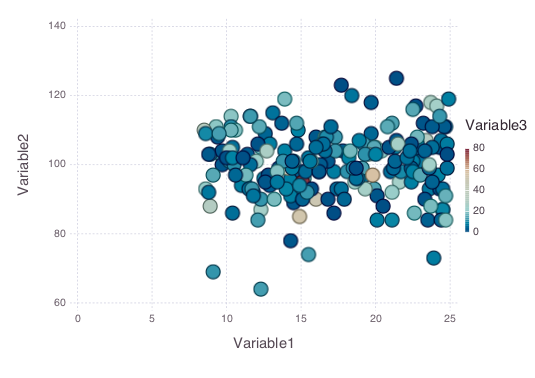

In [54]:
plot(data, x = :Variable1, y = :Variable2, color = :Variable3,
Scale.color_continuous(minvalue = minimum(data[:Variable3]), maxvalue = maximum(data[:Variable3])),
Theme(point_size = 7px))

### Manually choosing colors

A scale can also be colored manually.  Below we use categorical grouping by the `color` argument and then set the actual colors using `Scale.color_discrete_manual`.

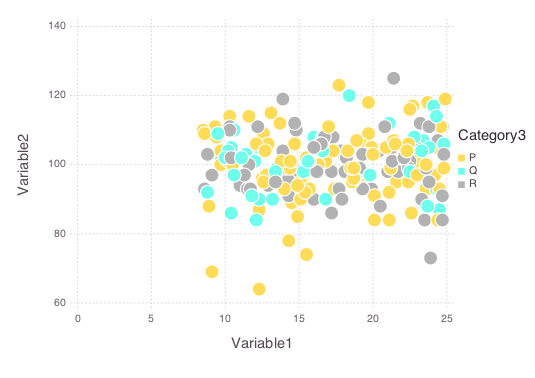

In [55]:
plot(data, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px))

### Another way of getting rid of grid lines

One last thing.  There is another way of getting rid of the grid lines.  Just set their `grid_line_width` to $ 0 $ pixels.

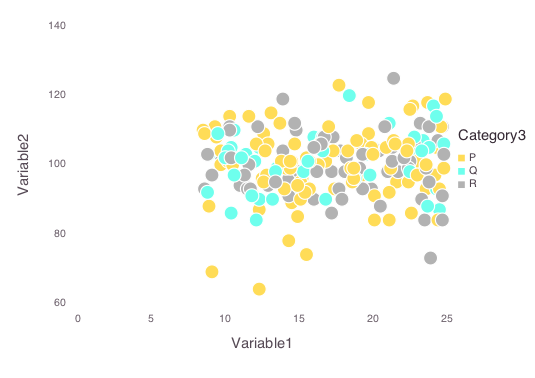

In [56]:
plot(data, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px, grid_line_width = 0px))

[Back to the top](#In-this-lesson)